# Task 2 
## Part 1

In [ ]:
# TODO: GRAPH TOOLS

In [10]:
# all imports used are here
import sklearn                          # this can be removed, I think
from sklearn import datasets            # this can be removed, I think
from matplotlib import pyplot as plt
import numpy as np

from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_val_score

(30, 4096)
[0 1 2]


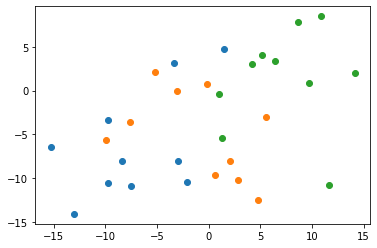

In [16]:
# TODO: replace this dataset with hospital data
################################################################################
# Create data; 3 clusters with 64^2 features
data, labels = datasets.make_blobs(n_samples = 30, n_features=64*64, centers=3, cluster_std=5)

print(data.shape) # (num_samples, num_features) (30, 4096) # (1, 4096)
print(np.unique(labels))

plt.figure()
plt.scatter(data[labels==0, 0], data[labels==0, 1])
plt.scatter(data[labels==1, 0], data[labels==1, 1])
plt.scatter(data[labels==2, 0], data[labels==2, 1])
plt.show()
################################################################################

## Part 2
### PCA reduction and model the covariance ratio with dimensions

Original Data Space: (30, 4096)
PCA projected Data Space: (30, 30)


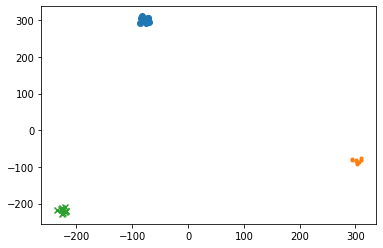

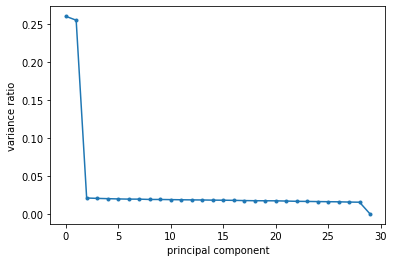

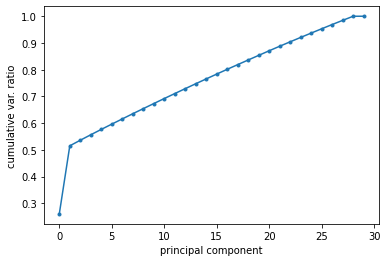

In [49]:
# PCA decomposition

# Hyper parameter
n_components = 30

# instances and features, expecting this variable name to change or removed
X = data

# define PCA
pca = PCA(n_components)

# fit model with dataset
# original data shape (30, 4096) this is (Num_samples, dimension of each samples)
# we transfer that into (30, 30) this is (Num_samples, dimension of each samples in PCA space)
# apparents this is more efficient to do fit and transform together
data_transf = pca.fit_transform(X)

print("Original Data Space:", X.shape)
print("PCA projected Data Space:", data_transf.shape)

# visualize all data points (30) using only first 2 PCA projected dimensions
plt.figure("data points with pca")
plt.scatter(data_transf[labels==0, 0], data_transf[labels==0, 1],marker='o')
plt.scatter(data_transf[labels==1, 0], data_transf[labels==1, 1],marker='.')
plt.scatter(data_transf[labels==2, 0], data_transf[labels==2, 1],marker='x')
plt.show()

plt.figure()
plt.plot((pca.explained_variance_ratio_) / np.sum(pca.explained_variance_ratio_),'.-')
plt.xlabel('principal component')
plt.ylabel('variance ratio')
plt.show()

plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_) / np.sum(pca.explained_variance_ratio_),'.-')
plt.xlabel('principal component')
plt.ylabel('cumulative var. ratio')
plt.show()

[1 1 2 2 2 0 2 0 1 2 1 1 0 0 2 0 1 2 0 0 1 1 1 0 0 2 2 2 0 1]
(3, 4096)


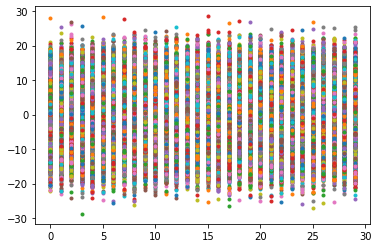

[1 1 2 2 2 0 2 0 1 2 1 1 0 0 2 0 1 2 0 0 1 1 1 0 0 2 2 2 0 1]
(3, 30)


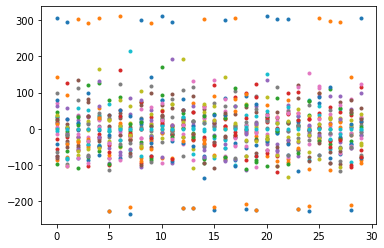

In [46]:
# Part 3 K-means clustering using sklearn

# Hyper parameter: n clusters
n_clusters = 3

X = data

kmeans = KMeans(n_clusters, random_state=0).fit(X)
print(kmeans.labels_)
print(kmeans.cluster_centers_.shape)
plt.figure()
# plt.plot(kmeans_trans.cluster_centers_,'.')
plt.plot(data,'.')
plt.show()

X_transf = data_transf
kmeans_transf = KMeans(n_clusters, random_state=0).fit(X_transf)
print(kmeans_transf.labels_)
print(kmeans_transf.cluster_centers_.shape)
plt.figure()
# plt.plot(kmeans_transf.cluster_centers_,'.')
plt.plot(data_transf,'.')
plt.show()

# Task 3

In [48]:
# KNN using sklearn

# Hyper parameter: k neighbors 
k_neighbors=3

X = data_transf
y = labels

neigh = KNeighborsClassifier(k_neighbors)
neigh.fit(X, y)

# x_min, x_max = X[:,0].min() - .5, X[:,0].max() + .5
# y_min, y_max = y[:,0].min() - .5, y[:,0].max() + .5

# print()

KNeighborsClassifier(n_neighbors=3)

In [11]:
# still working on this
# Binary tree using sklearn
from sklearn.datasets import load_iris      # to be removed

# Hyper parameter: Tree depth
dc_hyper = 0

clf = DecisionTreeClassifier(random_state=0)
iris = load_iris()
cross_val_score(clf, iris.data, iris.target, cv=10)

array([1.        , 0.93333333, 1.        , 0.93333333, 0.93333333,
       0.86666667, 0.93333333, 1.        , 1.        , 1.        ])